| Version | Date       | Developer | Remark             |
|---------|------------|-----------|--------------------|
| 1.0     | March-11-2025 | Johnson | Initial version: build models with sklearn & pycaret.    |
| 2.0     | March-17-2025 | Johnson | Update the pipeline_feature_engineering to add the classifier|
| 3.0     | March-18-2025 | Johnson | Delete force_plot() because it is not available in ADB|

**Context**

1.Vehicle Insurance Fraud Detection

Vehicle insurance fraud involves conspiring to make false or exaggerated claims involving property damage or personal injuries following an accident. Some common examples include staged accidents where fraudsters deliberately “arrange” for accidents to occur; the use of phantom passengers where people who were not even at the scene of the accident claim to have suffered grievous injury, and make false personal injury claims where personal injuries are grossly exaggerated.

2.About this dataset

This dataset contains vehicle dataset - attribute, model, accident details, etc along with policy details - policy type, tenure etc. The target is to detect if a claim application is fraudulent or not - FraudFound_P


# 1. Exploratory Data Analysis

In [0]:
%run ./Common_Function

     |████████████████████████████████| 980 kB 8.4 MB/s 
     |████████████████████████████████| 78 kB 9.2 MB/s 
     |████████████████████▊ 

*** WARNING: max output size exceeded, skipping output. ***

     |████████████████████████████████| 8.0 MB 67.1 MB/s 
     |████████████████████████████████| 227 kB 102.3 MB/s 
     |████████████████████████████████| 101 kB 19.0 MB/s 
     |████████████████████████████████| 98 kB 15.1 MB/s 
  Created wheel for pyod: filename=pyod-2.0.3-py3-none-any.whl size=200498 sha256=7ea14d399d5d3e8eaa56d2a5e1494aafb637a5e6e4a5771b5b902c260e62207c
  Stored in directory: /root/.cache/pip/wheels/f3/e3/4e/394197e811d176f65cdfaac253c240c9f98d7a9ab3b543e097
  Created wheel for stringcase: filename=stringcase-1.2.0-py3-none-any.whl size=3587 sha256=0dea6d40d3a9bf4a61df228d8c6605cfc1fe30e49e16547c6f0c804c2cf1c37f
  Stored in directory: /root/.cache/pip/wheels/0a/0d/86/88baa0554de5fdccfc2b2ee060175eec0a85c12cdfd8fef566
Successfully built pyod stringcase
  Attemptin

/databricks/python/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.0
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [0]:
data = pd.read_csv("https://raw.githubusercontent.com/DandiMahendris/Auto-Insurance-Fraud-Detection/refs/heads/main/data/dataset/insurance_claims.csv")
df_sp = spark.createDataFrame(data)
display(df_sp.limit(10))

months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,null
228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,2015-01-21,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,null
134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,2015-02-22,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,null
256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,2015-01-10,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,null
228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,2015-02-17,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,null
256,39,104594,2006-10-12,OH,250/500,1000,1351.1,0,478456,FEMALE,PhD,tech-support,bungie-jumping,unmarried,0,0,2015-01-02,Multi-vehicle Collision,Rear Collision,Major Damage,Fire,SC,Arlington,8973 Washington St,19,3,NO,0,2,NO,64100,6410,6410,51280,Saab,95,2003,Y,null
137,34,413978,2000-06-04,IN,250/500,1000,1333.35,0,441716,MALE,PhD,prof-specialty,board-games,husband,0,-77000,2015-01-13,Multi-vehicle Collision,Front Collision,Minor Damage,Police,NY,Springfield,5846 Weaver Drive,0,3,?,0,0,?,78650,21450,7150,50050,Nissan,Pathfinder,2012,N,null
165,37,429027,1990-02-03,IL,100/300,1000,1137.03,0,603195,MALE,Associate,tech-support,base-jumping,unmarried,0,0,2015-02-27,Multi-vehicle Collision,Front Collision,Total Loss,Police,VA,Columbus,3525 3rd Hwy,23,3,?,2,2,YES,51590,9380,9380,32830,Audi,A5,2015,N,null
27,33,485665,1997-02-05,IL,100/300,500,1442.99,0,601734,FEMALE,PhD,other-service,golf,own-child,0,0,2015-01-30,Single Vehicle Collision,Front Collision,Total Loss,Police,WV,Arlington,4872 Rock Ridge,21,1,NO,1,1,YES,27700,2770,2770,22160,Toyota,Camry,2012,N,null
212,42,636550,2011-07-25,IL,100/300,500,1315.68,0,600983,MALE,PhD,priv-house-serv,camping,wife,0,-39300,2015-01-05,Single Vehicle Collision,Rear Collision,Total Loss,Other,NC,Hillsdale,3066 Francis Ave,14,1,NO,2,1,?,42300,4700,4700,32900,Saab,92x,1996,N,null


In [0]:
num_rows = df_sp.count()  
num_cols = len(df_sp.columns)   
print(f'{num_rows} Records,{num_cols} Features.')

1000 Records,40 Features.


In [0]:
df_sp.printSchema()

root
 |-- months_as_customer: long (nullable = true)
 |-- age: long (nullable = true)
 |-- policy_number: long (nullable = true)
 |-- policy_bind_date: string (nullable = true)
 |-- policy_state: string (nullable = true)
 |-- policy_csl: string (nullable = true)
 |-- policy_deductable: long (nullable = true)
 |-- policy_annual_premium: double (nullable = true)
 |-- umbrella_limit: long (nullable = true)
 |-- insured_zip: long (nullable = true)
 |-- insured_sex: string (nullable = true)
 |-- insured_education_level: string (nullable = true)
 |-- insured_occupation: string (nullable = true)
 |-- insured_hobbies: string (nullable = true)
 |-- insured_relationship: string (nullable = true)
 |-- capital-gains: long (nullable = true)
 |-- capital-loss: long (nullable = true)
 |-- incident_date: string (nullable = true)
 |-- incident_type: string (nullable = true)
 |-- collision_type: string (nullable = true)
 |-- incident_severity: string (nullable = true)
 |-- authorities_contacted: string 

In [0]:
df_sp.describe().display()

summary,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,0
mean,203.954,38.948,546238.648,null,null,null,1136.0,1256.4061499999998,1101000.0,501214.488,null,null,null,null,null,25126.1,-26793.7,null,null,null,null,null,null,null,null,11.644,1.839,null,0.992,1.487,null,52761.94,7433.42,7399.57,37928.95,null,94.03846153846153,2005.103,null,null
stddev,115.11317442815539,9.140286693580288,257063.00527558496,null,null,null,611.8646732557604,244.167394961407,2297406.5981182083,71701.610941355,null,null,null,null,null,27872.18770813726,28104.09668643631,null,null,null,null,null,null,null,null,6.951372928104605,1.0188803252183827,null,0.8201271905068194,1.1113352626755195,null,26401.533190161346,4880.951853337071,4824.726178530528,18886.252893198423,null,1.0090091909944672,6.0158608346255384,null,null
min,0,19,100804,1990-01-08,IL,100/300,500,433.33,-1000000,430104,FEMALE,Associate,adm-clerical,base-jumping,husband,0,-111100,2015-01-01,Multi-vehicle Collision,?,Major Damage,Ambulance,NC,Arlington,1012 5th Lane,0,1,?,0,0,?,100,0,0,70,Accura,3 Series,1995,N,null
max,479,64,999435,2015-02-22,OH,500/1000,2000,2047.59,10000000,620962,MALE,PhD,transport-moving,yachting,wife,100500,0,2015-03-01,Vehicle Theft,Side Collision,Trivial Damage,Police,WV,Springfield,9988 Rock Ridge,23,4,YES,2,3,YES,114920,21450,23670,79560,Volkswagen,X6,2015,Y,null


In [0]:

categorical_columns = [field.name for field in df_sp.schema.fields 
                       if not isinstance(field.dataType, (IntegerType, FloatType, DoubleType, LongType))]

print("Categorical_Columns:", categorical_columns)

Categorical_Columns: ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


1000 unique values are in 1000 records of incident_location.

951 unique values are in 1000 records of policy_bind_date

In [0]:
unique_value=[]
colum_name=[]
# Iterate through the columns
for col in categorical_columns:
        colum_name.append(str(col))
        unique_value.append(data[col].nunique())
table= pd.DataFrame()
table['Col_name'] = colum_name
table['Unique_Value']= unique_value
            
table=table.sort_values('Unique_Value',ascending=False)
display(table)


Col_name,Unique_Value
incident_location,1000
policy_bind_date,951
incident_date,60
auto_model,39
insured_hobbies,20
auto_make,14
insured_occupation,14
insured_education_level,7
incident_city,7
incident_state,7


The column _c39 is all null.

In [0]:
df_pd = df_sp.toPandas()  

df_pd.isnull().sum()

Out[16]: months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage    

According to the value count of the target label, it is a unbalance dataset

Out[17]: <AxesSubplot:xlabel='fraud_reported', ylabel='count'>

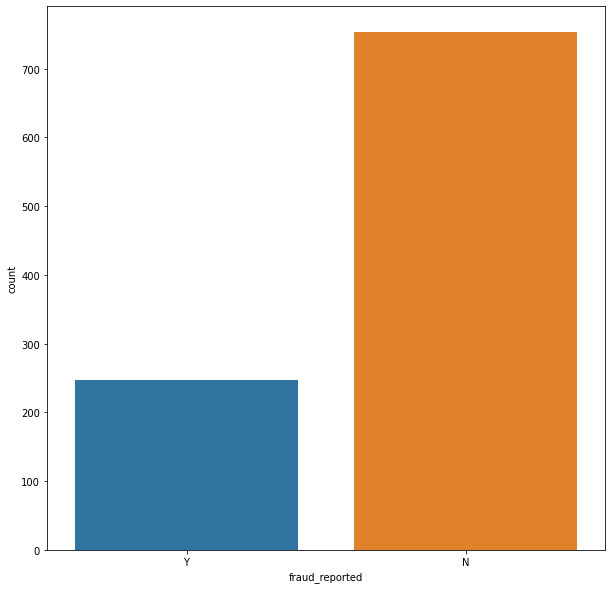

In [0]:
f, ax = plt.subplots(figsize=(10, 10))
sns.countplot(x='fraud_reported',data=df_pd)

In [0]:
df_sp.describe().display()

summary,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
mean,203.954,38.948,546238.648,null,null,1136.0,1256.4061499999998,1101000.0,501214.488,null,null,null,null,null,25126.1,-26793.7,null,null,null,null,null,null,null,11.644,1.839,null,0.992,1.487,null,52761.94,7433.42,7399.57,37928.95,null,94.03846153846153,2005.103,null
stddev,115.11317442815539,9.140286693580288,257063.00527558496,null,null,611.8646732557604,244.167394961407,2297406.5981182083,71701.610941355,null,null,null,null,null,27872.18770813726,28104.09668643631,null,null,null,null,null,null,null,6.951372928104605,1.0188803252183827,null,0.8201271905068194,1.1113352626755195,null,26401.533190161346,4880.951853337071,4824.726178530528,18886.252893198423,null,1.0090091909944672,6.0158608346255384,null
min,0,19,100804,IL,100/300,500,433.33,-1000000,430104,FEMALE,Associate,adm-clerical,base-jumping,husband,0,-111100,2015-01-01,Multi-vehicle Collision,?,Major Damage,Ambulance,NC,Arlington,0,1,?,0,0,?,100,0,0,70,Accura,3 Series,1995,N
max,479,64,999435,OH,500/1000,2000,2047.59,10000000,620962,MALE,PhD,transport-moving,yachting,wife,100500,0,2015-03-01,Vehicle Theft,Side Collision,Trivial Damage,Police,WV,Springfield,23,4,YES,2,3,YES,114920,21450,23670,79560,Volkswagen,X6,2015,Y


# 2. Data Engineering

In [0]:
df_sp = df_sp.drop('_c39') # High null rate
df_sp = df_sp.drop('incident_location') # Invalid data point
df_sp = df_sp.drop('policy_bind_date') # Invalid data point

#### Spark DataFrame

In [0]:
# categorical_columns = ['policy_state',
# 'policy_csl',
# 'insured_sex',
# 'insured_education_level',
# 'insured_occupation',
# 'insured_hobbies',
# 'insured_relationship',
# 'incident_date',
# 'incident_type',
# 'collision_type',
# 'incident_severity',
# 'authorities_contacted',
# 'incident_state',
# 'incident_city',
# #'incident_location',
# 'property_damage',
# 'police_report_available',
# 'auto_make',
# 'auto_model',
# 'fraud_reported']

print('categorical_columns:',categorical_columns)

categorical_columns: ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [0]:
numerical_columns = list(set(df_sp.columns) - set(categorical_columns))
print('numerical_columns:',numerical_columns)


numerical_columns: ['injury_claim', 'umbrella_limit', 'insured_zip', 'property_claim', 'witnesses', 'age', 'capital-gains', 'months_as_customer', 'incident_hour_of_the_day', 'policy_number', 'policy_annual_premium', 'auto_year', 'total_claim_amount', 'number_of_vehicles_involved', 'capital-loss', 'bodily_injuries', 'vehicle_claim', 'policy_deductable']


In [0]:
pipeline_feature_engineering = pipeline.fit(df_sp)
df_transform = pipeline_feature_engineering.transform(df_sp)
df_transform.head(5).display()

months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_state_index,policy_csl_index,insured_sex_index,insured_education_level_index,insured_occupation_index,insured_hobbies_index,insured_relationship_index,incident_date_index,incident_type_index,collision_type_index,incident_severity_index,authorities_contacted_index,incident_state_index,incident_city_index,property_damage_index,police_report_available_index,auto_make_index,auto_model_index,fraud_reported_index,policy_state_encoded,policy_csl_encoded,insured_sex_encoded,insured_education_level_encoded,insured_occupation_encoded,insured_hobbies_encoded,insured_relationship_encoded,incident_date_encoded,incident_type_encoded,collision_type_encoded,incident_severity_encoded,authorities_contacted_encoded,incident_state_encoded,incident_city_encoded,property_damage_encoded,police_report_available_encoded,auto_make_encoded,auto_model_encoded,fraud_reported_encoded,injury_claim_vec,umbrella_limit_vec,insured_zip_vec,property_claim_vec,witnesses_vec,age_vec,capital-gains_vec,months_as_customer_vec,incident_hour_of_the_day_vec,policy_number_vec,policy_annual_premium_vec,auto_year_vec,total_claim_amount_vec,number_of_vehicles_involved_vec,capital-loss_vec,bodily_injuries_vec,vehicle_claim_vec,policy_deductable_vec,injury_claim_normalized,umbrella_limit_normalized,insured_zip_normalized,property_claim_normalized,witnesses_normalized,age_normalized,capital-gains_normalized,months_as_customer_normalized,incident_hour_of_the_day_normalized,policy_number_normalized,policy_annual_premium_normalized,auto_year_normalized,total_claim_amount_normalized,number_of_vehicles_involved_normalized,capital-loss_normalized,bodily_injuries_normalized,vehicle_claim_normalized,policy_deductable_normalized,features
328,48,521585,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,2015-01-25,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,0.0,0.0,1.0,3.0,5.0,17.0,3.0,53.0,1.0,1.0,2.0,0.0,1.0,2.0,2.0,2.0,1.0,11.0,1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 7, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(5), values -> List(1.0))","Map(vectorType -> sparse, length -> 20, indices -> List(17), values -> List(1.0))","Map(vectorType -> sparse, length -> 6, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 60, indices -> List(53), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 4, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 5, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 7, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 7, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(2), values -> List(1.0))","Map(vectorType -> sparse, length -> 14, indices -> List(1), values -> Li

In [0]:
# from pyspark.ml.functions import vector_to_array
# import pyspark.pandas as ps

# # Step 1: Convert vector column ("features") into an array
# df_array = df_final.withColumn("features_array", vector_to_array("features"))

# # Step 2: Determine the number of features (get from first row)
# num_features = len(df_array.select("features_array").first()["features_array"])

# # Step 3: Expand array into separate feature columns
# feature_columns = [f"feature_{i}" for i in range(num_features)]
# for i in range(num_features):
#     df_array = df_array.withColumn(feature_columns[i], df_array["features_array"][i])

# # Step 4: Drop original "features" vector column and "features_array"
# df_expanded = df_array.drop("features", "features_array")

# # Step 5: Convert to Pandas-on-Spark DataFrame
# df_pandas_on_spark = ps.DataFrame(df_expanded)
# df_pandas_on_spark.columns = categorical_columns + numerical_columns
# # Display the Pandas-on-Spark DataFrame
# df_pandas_on_spark.display()

In [0]:
# # Call the function with df_transformed as input


# from pyspark.ml.feature import VectorAssembler

# def vectorize_features(df_transformed,input_columns):
#     # Step 1: Select the features to vectorize


#     # Step 2: Create a new VectorAssembler to combine features
#     assembler = VectorAssembler(inputCols=input_columns, outputCol="features")

#     # Step 3: Rename expenses to label
#     df_transformed = df_transformed.withColumnRenamed("fraud_reported_index", "label")

#     # Step 4: Vectorize the features using VectorAssembler
#     df_vector = assembler.transform(df_transformed)
#     df_final = df_vector.select("label", "features")

#     return df_final


# df_col = df_final.columns
# df_col.remove('fraud_reported_index')

# df_final = vectorize_features(df_final,df_col)
# display(df_final.limit(5))

In [0]:
# X = np.array(df_final.select('features').rdd.flatMap(lambda x: x).collect()) 
# y = np.array(df_final.select('label').rdd.flatMap(lambda x: x).collect())
# dataset_pd = X.merge(y)
# dataset_pd.head()


#### Pandas DataFrame

In [0]:
X = df_pd.iloc[:,:-1]
X

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,2014-10-17,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,2006-06-27,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,2000-09-06,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,1990-05-25,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,2014-06-06,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,1991-07-16,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,2014-01-05,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,2003-02-17,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,2011-11-18,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [0]:
df_pd = df_sp.toPandas()
df_pd['fraud_reported'] = df_pd['fraud_reported'].map({'Y': 1, 'N': 0})

df_dataset_pd = pd.get_dummies(df_pd)
y = df_dataset_pd[['fraud_reported']]
X = df_dataset_pd.drop('fraud_reported',axis=1)


df_dataset_pd.display()

months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported,policy_state_IL,policy_state_IN,policy_state_OH,policy_csl_100/300,policy_csl_250/500,policy_csl_500/1000,insured_sex_FEMALE,insured_sex_MALE,insured_education_level_Associate,insured_education_level_College,insured_education_level_High School,insured_education_level_JD,insured_education_level_MD,insured_education_level_Masters,insured_education_level_PhD,insured_occupation_adm-clerical,insured_occupation_armed-forces,insured_occupation_craft-repair,insured_occupation_exec-managerial,insured_occupation_farming-fishing,insured_occupation_handlers-cleaners,insured_occupation_machine-op-inspct,insured_occupation_other-service,insured_occupation_priv-house-serv,insured_occupation_prof-specialty,insured_occupation_protective-serv,insured_occupation_sales,insured_occupation_tech-support,insured_occupation_transport-moving,insured_hobbies_base-jumping,insured_hobbies_basketball,insured_hobbies_board-games,insured_hobbies_bungie-jumping,insured_hobbies_camping,insured_hobbies_chess,insured_hobbies_cross-fit,insured_hobbies_dancing,insured_hobbies_exercise,insured_hobbies_golf,insured_hobbies_hiking,insured_hobbies_kayaking,insured_hobbies_movies,insured_hobbies_paintball,insured_hobbies_polo,insured_hobbies_reading,insured_hobbies_skydiving,insured_hobbies_sleeping,insured_hobbies_video-games,insured_hobbies_yachting,insured_relationship_husband,insured_relationship_not-in-family,insured_relationship_other-relative,insured_relationship_own-child,insured_relationship_unmarried,insured_relationship_wife,incident_date_2015-01-01,incident_date_2015-01-02,incident_date_2015-01-03,incident_date_2015-01-04,incident_date_2015-01-05,incident_date_2015-01-06,incident_date_2015-01-07,incident_date_2015-01-08,incident_date_2015-01-09,incident_date_2015-01-10,incident_date_2015-01-11,incident_date_2015-01-12,incident_date_2015-01-13,incident_date_2015-01-14,incident_date_2015-01-15,incident_date_2015-01-16,incident_date_2015-01-17,incident_date_2015-01-18,incident_date_2015-01-19,incident_date_2015-01-20,incident_date_2015-01-21,incident_date_2015-01-22,incident_date_2015-01-23,incident_date_2015-01-24,incident_date_2015-01-25,incident_date_2015-01-26,incident_date_2015-01-27,incident_date_2015-01-28,incident_date_2015-01-29,incident_date_2015-01-30,incident_date_2015-01-31,incident_date_2015-02-01,incident_date_2015-02-02,incident_date_2015-02-03,incident_date_2015-02-04,incident_date_2015-02-05,incident_date_2015-02-06,incident_date_2015-02-07,incident_date_2015-02-08,incident_date_2015-02-09,incident_date_2015-02-10,incident_date_2015-02-11,incident_date_2015-02-12,incident_date_2015-02-13,incident_date_2015-02-14,incident_date_2015-02-15,incident_date_2015-02-16,incident_date_2015-02-17,incident_date_2015-02-18,incident_date_2015-02-19,incident_date_2015-02-20,incident_date_2015-02-21,incident_date_2015-02-22,incident_date_2015-02-23,incident_date_2015-02-24,incident_date_2015-02-25,incident_date_2015-02-26,incident_date_2015-02-27,incident_date_2015-02-28,incident_date_2015-03-01,incident_type_Multi-vehicle Collision,incident_type_Parked Car,incident_type_Single Vehicle Collision,incident_type_Vehicle Theft,collision_type_?,collision_type_Front Collision,collision_type_Rear Collision,collision_type_Side Collision,incident_severity_Major Damage,incident_severity_Minor Damage,incident_severity_Total Loss,incident_severity_Trivial Damage,authorities_contacted_Ambulance,authorities_contacted_Fire,authorities_contacted_None,authorities_contacted_Other,authorities_contacted_Police,incident_state_NC,incident_state_NY,incident_state_OH,incident_state_PA,incident_state_SC,incident_state_VA,incident_state_WV,incident_city_Arlington,incident_city_Columbus,inciden

In [0]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

# 3. Model Training and Evaluation Metrics

#### Auto ML with pycaret

In [0]:
from pycaret.classification import *
setup(df_dataset_pd,target='fraud_reported',session_id=123)
for i in ['acc','precision','recall','f1','kappa','mcc']:
    remove_metric(i)

,Description,Value
0,Session id,123
1,Target,fraud_reported
2,Target type,Binary
3,Original data shape,"(1000, 224)"
4,Transformed data shape,"(1000, 224)"
5,Transformed train set shape,"(700, 224)"
6,Transformed test set shape,"(300, 224)"
7,Numeric features,223
8,Preprocess,True
9,Imputation type,simple


In [0]:
best = compare_models(sort='auc')

,Model,AUC,TT (Sec)
rf,Random Forest Classifier,0.8525,0.259
et,Extra Trees Classifier,0.8467,0.212
ridge,Ridge Classifier,0.8462,0.030
gbc,Gradient Boosting Classifier,0.8460,0.457
lightgbm,Light Gradient Boosting Machine,0.8444,0.839
lda,Linear Discriminant Analysis,0.8401,0.059
ada,Ada Boost Classifier,0.7947,0.170
dt,Decision Tree Classifier,0.7581,0.054
nb,Naive Bayes,0.5497,0.030
lr,Logistic Regression,0.5453,0.677


In [0]:
print(best)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)


### Scikit-learn

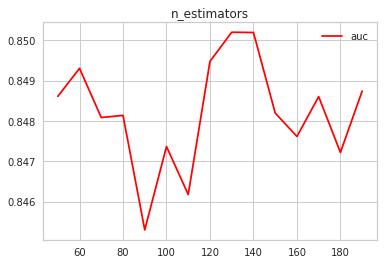

In [0]:
para = 'n_estimators'
rf = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_jobs=-1,
                       oob_score=False, verbose=0,
                       warm_start=False,random_state=123)
plot_learning_curve(X_train, y_train,rf, para, start=50, end=200, step=10,cv=10)

In [0]:
# para = 'max_depth'
# rf = RandomForestClassifier(n_estimators=110
#                            ,rbootstrap=True, ccp_alpha=0.0, class_weight=None,
#                        criterion='gini', max_depth=None, max_features='sqrt',
#                        max_leaf_nodes=None, max_samples=None,
#                        min_impurity_decrease=0.0, min_samples_leaf=1,
#                        min_samples_split=2, min_weight_fraction_leaf=0.0,
#                        monotonic_cst=None, n_jobs=-1,
#                        oob_score=False, verbose=0,
#                        warm_start=False,random_state=123)
# plot_learning_curve(rf, para, start=1, end=10, step=1)

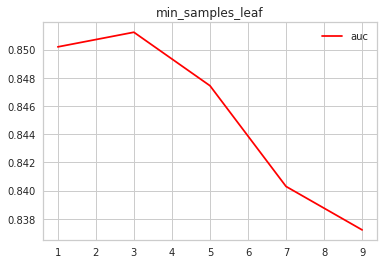

In [0]:
para = 'min_samples_leaf'
rf = RandomForestClassifier(n_estimators=140,
                           bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_jobs=-1,
                       oob_score=False, verbose=0,
                       warm_start=False,random_state=123)
plot_learning_curve(X_train, y_train,rf, para, start=1, end=10, step=2, cv=10)


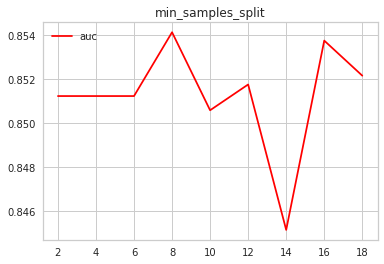

In [0]:
para = 'min_samples_split'
rf = RandomForestClassifier(min_samples_leaf=3,
                           n_estimators=140,
                           bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_jobs=-1,
                       oob_score=False, verbose=0,
                       warm_start=False,random_state=123)
plot_learning_curve(X_train, y_train,rf, para, start=2, end=20, step=2, cv=10)

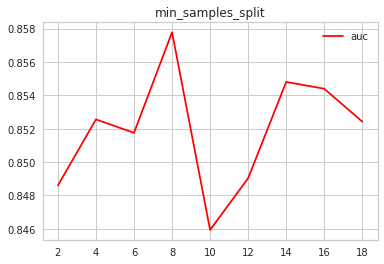

In [0]:
para = 'min_samples_split'
rf = RandomForestClassifier(min_samples_leaf=1,
                           n_estimators=170,
                           bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_jobs=-1,
                       oob_score=False, verbose=0,
                       warm_start=False,random_state=123)
plot_learning_curve(X_train, y_train,rf, para, start=2, end=20, step=2, cv=10)

In [0]:
param_grid = {
    'n_estimators': list(range(135, 142, 1)),
    'min_samples_split': [7, 8, 9],
    'min_samples_leaf': [4,5,3]
}

rf = RandomForestClassifier(
                           bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_jobs=-1,
                       oob_score=False, verbose=0,
                       warm_start=False,random_state=123)

grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=10, scoring='roc_auc', n_jobs=-1)

grid_search.fit(X_train, y_train)

results = pd.DataFrame(grid_search.cv_results_)[['params', 'mean_test_score', 'std_test_score', 'rank_test_score']]

results = results.sort_values(by='mean_test_score', ascending=False).round(4)

results.head(3).display()
# 0.8583

params,mean_test_score,std_test_score,rank_test_score
"Map(n_estimators -> 136, min_samples_split -> 7, min_samples_leaf -> 3)",0.8583,0.0435,1
"Map(n_estimators -> 135, min_samples_split -> 7, min_samples_leaf -> 3)",0.8582,0.0429,2
"Map(n_estimators -> 141, min_samples_split -> 7, min_samples_leaf -> 3)",0.8575,0.0447,3


In [0]:
rf = RandomForestClassifier( n_estimators=136
                           ,min_samples_leaf=3
                           ,min_samples_split=7
                           ,bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_jobs=-1,
                       oob_score=False, verbose=0,
                       warm_start=False,random_state=123)
rf.fit(X_train, y_train)
predictions_rf = rf.predict(X_test)

# Get predicted probabilities for the positive class (1)
y_prob_rf = rf.predict_proba(X_test)[:, 1]

# Compute AUC score
auc_rf = roc_auc_score(y_test, y_prob_rf)

print(f"AUC Score: {auc_rf:.4f}")

AUC Score: 0.8075


# 4.Explain The Model 

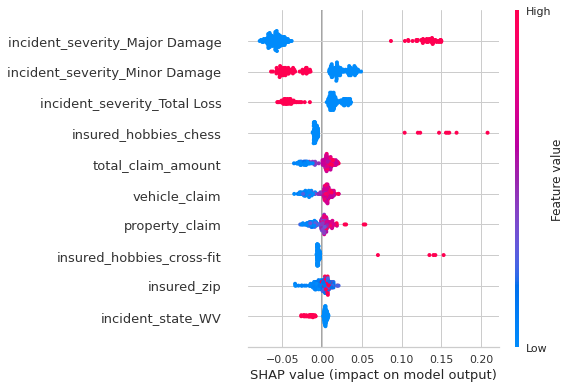

In [0]:
explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_test) 
shap.summary_plot(shap_values[:, :, 1], X_test,max_display=10) 

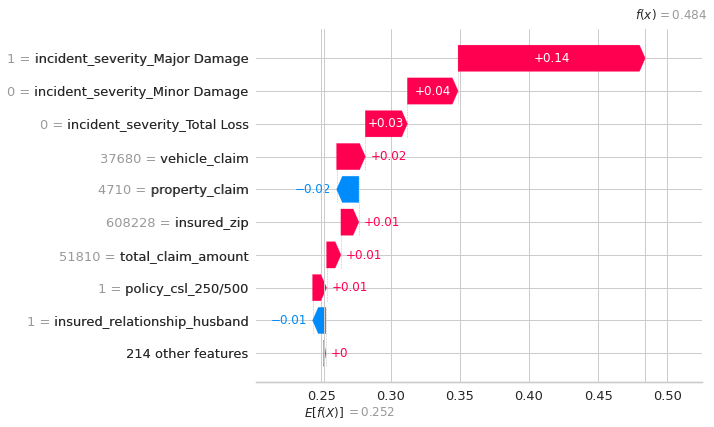

In [0]:
# Choose the SHAP values for a specific sample and class (e.g., second class)
sample_index = 6  # Index of the sample you want to visualize (e.g., first sample)
class_index = 1  # Index for the class you are interested in (e.g., second class)

# Wrap the SHAP values for that sample and class into an Explanation object
shap_explanation = shap.Explanation(values=shap_values[:, :, class_index][sample_index],
                                    base_values=explainer.expected_value[class_index],
                                    data=X_test.iloc[sample_index, :])

shap.plots.waterfall(shap_explanation)

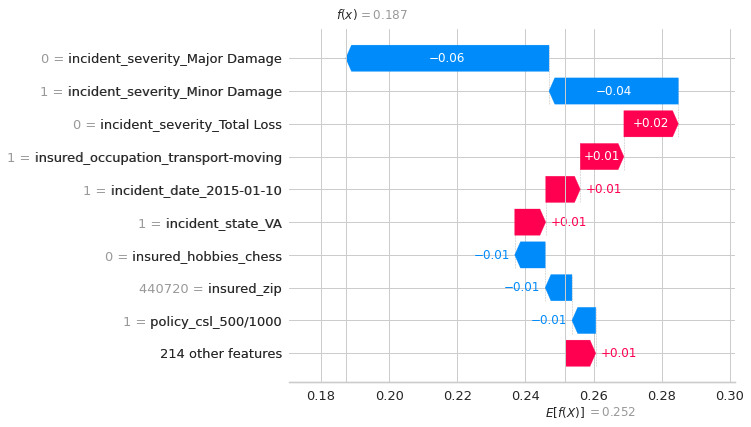

In [0]:
# Choose the SHAP values for a specific sample and class (e.g., second class)
sample_index = 5  # Index of the sample you want to visualize (e.g., first sample)
class_index = 1  # Index for the class you are interested in (e.g., second class)

# Wrap the SHAP values for that sample and class into an Explanation object
shap_explanation = shap.Explanation(values=shap_values[:, :, class_index][sample_index],
                                    base_values=explainer.expected_value[class_index],
                                    data=X_test.iloc[sample_index, :])

shap.plots.waterfall(shap_explanation)

# 5.Model Application

In [0]:
from pyspark.ml.classification import RandomForestClassifier as Spark_RandomForestClassifier

# Define RandomForestClassifier
rf = Spark_RandomForestClassifier(
    numTrees=136,   
    maxDepth=5,  
    minInstancesPerNode=3,
    minInfoGain=0.0,
    featureSubsetStrategy="sqrt",
    seed=123,
    labelCol="fraud_reported_index",  
    featuresCol="features",
)

# Extract existing stages from pipeline_feature_engineering
existing_stages = pipeline_feature_engineering.stages  # List of existing pipeline stages

# Append RandomForestClassifier to the existing stages
new_stages = existing_stages + [rf]

# Create a new pipeline with the updated stages
pipeline_production = Pipeline(stages=new_stages)

# Fit the updated pipeline on the dataset
model = pipeline_production.fit(df_sp)

# Save the updated pipeline
path_saved = "/Workspace/Users/hejiekun@hotmail.com/pipeline_production_0318"
model.save(path_saved)

---------------------------------------------------------------------------
Py4JJavaError                             Traceback (most recent call last)
File <command-662987468176526>:29
     27 # Save the updated pipeline
     28 path_saved = "/Workspace/Users/hejiekun@hotmail.com/pipeline_production_0318"
---> 29 model.save(path_saved)

File /databricks/spark/python/pyspark/ml/util.py:340, in MLWritable.save(self, path)
    338 def save(self, path: str) -> None:
    339     """Save this ML instance to the given path, a shortcut of 'write().save(path)'."""
--> 340     self.write().save(path)

File /databricks/spark/python/pyspark/ml/util.py:291, in JavaMLWriter.save(self, path)
    289 if not isinstance(path, str):
    290     raise TypeError("path should be a string, got type %s" % type(path))
--> 291 self._jwrite.save(path)

File /databricks/spark/python/lib/py4j-0.10.9.5-src.zip/py4j/java_gateway.py:1321, in JavaMember.__call__(self, *args)
   1315 command = proto.CALL_COMMAND_NAME 

In [0]:
# # Input the new claim to predictexpected expenses
# age = int(input("Enter age: "))
# sex = input("Enter sex: ")
# bmi = float(input("Enter BMI: "))
# children = int(input("Enter number of children: "))
# smoker = input("Enter smoker status (yes/no): ")
# region = input("Enter region: ")
# actual_expenses = float(input("Enter expenses: "))
# application_predict_expenses(path_saved, age, sex, bmi, children, smoker, region, actual_expenses)

# # application_predict_expenses(path_saved, 25, "male", 22.0, 0, "no", "southwest", 16884.92)

In [0]:
sample.display()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-662987468176531>:1
----> 1 sample.display()

NameError: name 'sample' is not defined

In [0]:
sample = df_sp.drop('fraud_reported').limit(1)

loaded_model = PipelineModel.load(path_saved)
predictions = loaded_model.transform(sample)

---------------------------------------------------------------------------
IllegalArgumentException                  Traceback (most recent call last)
File <command-2111560689717335>:4
      1 sample = df_sp.drop('fraud_reported').limit(1)
      3 loaded_model = PipelineModel.load(path_saved)
----> 4 predictions = loaded_model.transform(sample)

File /databricks/python_shell/dbruntime/MLWorkloadsInstrumentation/_pyspark.py:30, in _create_patch_function.<locals>.patched_method(self, *args, **kwargs)
     28 call_succeeded = False
     29 try:
---> 30     result = original_method(self, *args, **kwargs)
     31     call_succeeded = True
     32     return result

File /databricks/spark/python/pyspark/ml/base.py:262, in Transformer.transform(self, dataset, params)
    260         return self.copy(params)._transform(dataset)
    261     else:
--> 262         return self._transform(dataset)
    263 else:
    264     raise TypeError("Params must be a param map but got %s." % type(params))

F

In [0]:
sample

Out[43]: DataFrame[months_as_customer: bigint, age: bigint, policy_number: bigint, policy_state: string, policy_csl: string, policy_deductable: bigint, policy_annual_premium: double, umbrella_limit: bigint, insured_zip: bigint, insured_sex: string, insured_education_level: string, insured_occupation: string, insured_hobbies: string, insured_relationship: string, capital-gains: bigint, capital-loss: bigint, incident_date: string, incident_type: string, collision_type: string, incident_severity: string, authorities_contacted: string, incident_state: string, incident_city: string, incident_hour_of_the_day: bigint, number_of_vehicles_involved: bigint, property_damage: string, bodily_injuries: bigint, witnesses: bigint, police_report_available: string, total_claim_amount: bigint, injury_claim: bigint, property_claim: bigint, vehicle_claim: bigint, auto_make: string, auto_model: string, auto_year: bigint]

In [0]:
predictions

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-662987468176527>:1
----> 1 predictions

NameError: name 'predictions' is not defined